In [1]:
import librosa
from IPython.display import Audio
import tensorflow as tf
from models.vqvae2 import *
from IPython import display

import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import tensorflow_probability as tfp
import time
import os 
import librosa.display
import numpy as np

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import of 'jit' requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit


In [107]:
fantasie_low, sr2 = librosa.load("/Users/jerms/Documents/Music/Bad Recordings/gimpromptu.mp4", sr=22050)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


In [116]:
widmung, sr = librosa.load("/Users/jerms/Documents/Music/Bad Recordings/bad_widmung.wav", sr=44100)
fantasie, sr = librosa.load("/Users/jerms/Documents/Music/Bad Recordings/gimpromptu.mp4", sr=44100)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


In [3]:
vqvae_trainer = VQVAETrainer(latent_dim=None, num_embeddings=None)
vqvae_trainer.load_weights("./saved_models/savio_model_1")
vqvae_trainer.compile(optimizer=keras.optimizers.Adam())

2021-10-28 19:53:19.707017: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [17]:
def audio_stfts(x, sr = 44100):
    x = librosa.util.normalize(x)
    chunk_length = 2048 * 22
    if len(x) % chunk_length != 0:
        multiple = np.ceil(len(x) / chunk_length)
        pad_amount = chunk_length * multiple - len(x)
        x = np.pad(x, (0, int(pad_amount)), 'constant', constant_values=(0, 0))

    # split in 2 second chunks and export to files 
    arr = []
    angles = []
    for i in range(0, len(x), 2048 * 22):
        y = x[i : i + 2048 * 22]
        stft = librosa.stft(y)
        mag = -1 * librosa.amplitude_to_db(np.abs(stft), ref=np.max) / 80.
        angle = np.angle(stft)
        
        mag, angle = mag[:-1, :-1], angle[:-1, :-1]
        arr.append(mag)
        angles.append(angle)
    
    return np.array(arr), np.array(angles)

def P2R(radii, angles):
    return radii * np.exp(1j*angles)

# This should invert the results of audio_stfts
def reconstruct_audio(db, angles):    
    stfts = P2R(librosa.db_to_amplitude(db * -80.), angles)
    stft = np.concatenate(stfts, axis=1)
    audio = librosa.istft(stft)
    return audio

In [117]:
w_db, w_phases = audio_stfts(widmung[5 * sr : -5 * sr])
f_dbs, f_phases = audio_stfts(fantasie[12 * sr : (4 * 60 + 50) * sr])

# Split encoder and decoder

In [61]:
vqvae_trainer.vqvae.summary()

Model: "vq_vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 1024, 88, 1) 0                                            
__________________________________________________________________________________________________
model (Functional)              (None, 256, 22, 128) 427648      input_5[0][0]                    
__________________________________________________________________________________________________
model_1 (Functional)            (None, 128, 11, 128) 352768      model[0][0]                      
__________________________________________________________________________________________________
conv2d_23 (Conv2D)              (None, 128, 11, 64)  8256        model_1[0][0]                    
_____________________________________________________________________________________________

In [72]:
from tensorflow import keras
from tensorflow.keras import layers
encoder = keras.Model(inputs=vqvae_trainer.vqvae.input, outputs=vqvae_trainer.vqvae.get_layer("conv2d_23").output)
decoder_layer = vqvae_trainer.vqvae.get_layer("model_3")
decoder = keras.Model(inputs=decoder_layer.input, outputs=decoder_layer.output)

In [141]:
quant_inputs = tf.keras.Input(shape=(256, 22, 64),name="vector_quantizer")

<KerasTensor: shape=(None, 256, 22, 64) dtype=float32 (created by layer 'vector_quantizer')>

In [143]:
first_quantizer_layer = vqvae_trainer.vqvae.get_layer("vector_quantizer")
first_quantizer = keras.Model(inputs=quant_inputs, outputs=first_quantizer_layer.output)

ValueError: Graph disconnected: cannot obtain value for tensor KerasTensor(type_spec=TensorSpec(shape=(None, 1024, 88, 1), dtype=tf.float32, name='input_5'), name='input_5', description="created by layer 'input_5'") at layer "model". The following previous layers were accessed without issue: []

# Testing Interpolation

In [118]:
widmung_latent = encoder(w_db)
fantasie_laten = encoder(f_dbs)

In [41]:
interpolated = (widmung_latent + fantasie_laten[:-6, :, :, :]) / 2.
decoded = decoder(interpolated)

In [50]:
interpolated_results = decoded.numpy().reshape(132, 1024, 88)
interpolated_sound = reconstruct_audio(interpolated_results, angles)

# Reconstructions

In [131]:
widmung_decoded = decoder(widmung_latent)
fantasie_decoded = decoder(fantasie_laten)

In [121]:
fantasie_decoded = fantasie_decoded.numpy().reshape(273, 1024, 88)
widmung_decoded = widmung_decoded.numpy().reshape(253, 1024, 88)

In [122]:
widmung_sound = reconstruct_audio(widmung_decoded, w_phases)
fantasie_sound = reconstruct_audio(fantasie_decoded, f_phases)

In [128]:
f_stft_to_audio = reconstruct_audio(f_dbs, f_phases)

# Fantasie Impromptu (og, model)

# Model Reconstructed Audio

# Audio Inversion (Audio to Spectrum to Audio)

# Widmung (og, model)

# Spectrum Plots

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/librosa/display.py:862: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/librosa/display.py:862: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/librosa/display.py:862: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


Text(0.5, 1.0, 'Reconstructed')

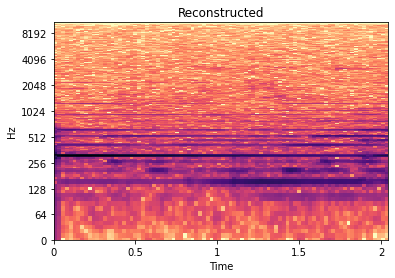

In [12]:
fig, ax = plt.subplots()
img = librosa.display.specshow(db[30],y_axis='log', x_axis='time', ax=ax)
ax.set_title('Reconstructed')

# Fantasie Impromptu

In [130]:
Audio(f_y, rate=22050)

In [20]:
fpreds.shape

TensorShape([138, 1024, 88, 1])

Text(0.5, 1.0, 'Reconstructed')

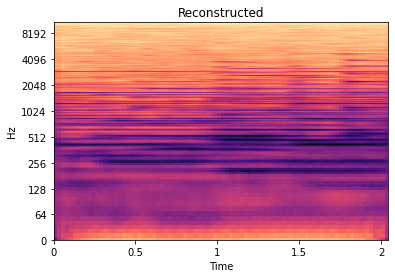

In [28]:
fig, ax = plt.subplots()
img = librosa.display.specshow(f_predicted[30][:, :] * 80,y_axis='log', x_axis='time', ax=ax)
ax.set_title('Reconstructed')

Text(0.5, 1.0, 'Reconstructed')

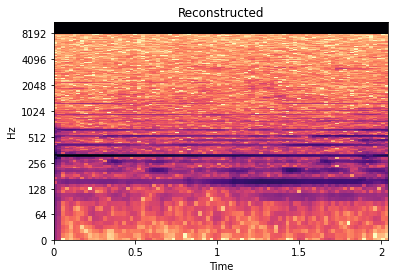

In [93]:
fig, ax = plt.subplots()
img = librosa.display.specshow(db[30] * 80,y_axis='log', x_axis='time', ax=ax)
ax.set_title('Reconstructed')

In [68]:
n_fft = 2048
Fs = 22050
frequency_bins = np.arange(0, 1 + n_fft / 2) * Fs / n_fft